In [1]:
import pyathena as pa
import sys
import os
import os.path as osp
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

sys.path.insert(0,'..')


In [2]:
# in here are stored all the data from the simulation 
data = pa.LoadSim('/home/comejuliet/TIGRESS', verbose = True)

LoadSim-INFO: savdir : /home/comejuliet/TIGRESS
LoadSim-INFO: basedir: /home/comejuliet/TIGRESS
LoadSim-INFO: athinput: /home/comejuliet/TIGRESS/out.txt
LoadSim-INFO: problem_id: R8_8pc_NCRSP
LoadSim-INFO: timeit.txt not found.
LoadSim-INFO: hst: /home/comejuliet/TIGRESS/hst/R8_8pc_NCRSP.hst
LoadSim-INFO: sn: /home/comejuliet/TIGRESS/hst/R8_8pc_NCRSP.sn
LoadSim-INFO: vtk in tar: /home/comejuliet/TIGRESS/vtk nums: 200-390
LoadSim-INFO: starpar_vtk: /home/comejuliet/TIGRESS/starpar nums: 0-438
LoadSim-WARNING: zprof files not found in /home/comejuliet/TIGRESS.
LoadSim-WARNING: rst files not found in /home/comejuliet/TIGRESS.
/home/comejuliet/miniconda3/envs/pyathena/lib/python3.10/site-packages/dateutil/parser/_parser.py:1207: UnknownTimezoneWarning: tzname PDT identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  warnings.warn("tzname {tzname} identified but not understood.  "

In [3]:
units=data.u

In [4]:
data.print_all_properties()

Attributes:
 ['basedir', 'basename', 'load_method', 'loglevel_def', 'logger', 'savdir', '_out_fmt_def', 'files', 'par', 'out_fmt', 'problem_id', 'nums', 'nums_id0', 'nums_tar', 'nums_starpar', '_fmt_vtk2d_not_found', 'domain', 'config_time', 'u', 'dfi']

Methods:
Decorators: Class containing a collection of decorators for prompt reading of analysis
        output, (reprocessed) hst, and zprof. Used in child classes.

        
-------------------------
_find_files: Function to find all output files under basedir and create "files" dictionary.

        hst: problem_id.hst
        sn: problem_id.sn (file format identical to hst)
        vtk: problem_id.num.vtk
        vtk_tar: problem_id.num.tar
        starpar_vtk: problem_id.num.starpar.vtk
        zprof: problem_id.num.phase.zprof
        timeit: timtit.txt
        
-------------------------
_find_match: None
-------------------------
_get_domain_from_par: Get domain info from par['domain1']. Time is set to None.
        
-------------

In [5]:
print(data.basedir, data.basename, data.problem_id, data.load_method)

/home/comejuliet/TIGRESS TIGRESS R8_8pc_NCRSP pyathena


In [6]:
print(data.files.keys())

dict_keys(['athinput', 'hst', 'sn', 'vtk', 'vtk_id0', 'vtk_tar', 'starpar_vtk'])


In [7]:
data.files['hst']

'/home/comejuliet/TIGRESS/hst/R8_8pc_NCRSP.hst'

In [8]:
print(data.par.keys()) # input parameter blocks (read from out.txt (stdout) of the simulation)

dict_keys(['job', 'log', 'output1', 'output2', 'output3', 'output4', 'output5', 'time', 'domain1', 'problem', 'feedback', 'cooling', 'opacity', 'radps', 'configure'])


In [9]:
data.par['domain1'] # domain parameters

{'level': 0,
 'Nx1': 256,
 'x1min': -1024,
 'x1max': 1024,
 'bc_ix1': 4,
 'bc_ox1': 4,
 'Nx2': 512,
 'x2min': -2048,
 'x2max': 2048,
 'bc_ix2': 4,
 'bc_ox2': 4,
 'Nx3': 768,
 'x3min': -3072,
 'x3max': 3072,
 'bc_ix3': 2,
 'bc_ox3': 2,
 'NGrid_x1': 4,
 'NGrid_x2': 8,
 'NGrid_x3': 24,
 'AutoWithNProc': 0}

In [10]:
# Nx: number of pixels for each dimension
# le, re: coordinates of the left and right edge in kpc

data.domain # dictionary containing essential domain info ; le/re means left/right edge

{'Nx': array([256, 512, 768]),
 'ndim': 3,
 'le': array([-1024, -2048, -3072]),
 're': array([1024, 2048, 3072]),
 'Lx': array([2048, 4096, 6144]),
 'dx': array([8., 8., 8.]),
 'center': array([0., 0., 0.]),
 'time': None}

In [11]:
# READING THE HISTORY FILE
hst = pa.read_hst(data.files['hst']) # pandas DataFrame
hst.columns

Index(['time', 'dt', 'mass', 'totalE', 'x1Mom', 'x2Mom', 'x3Mom', 'x1KE',
       'x2KE', 'x3KE', 'x1ME', 'x2ME', 'x3ME', 'gravPE', 'scalar0', 'scalar1',
       'scalar2', 'scalar3', 'scalar4', 'dmasssink', 'dM1sink', 'dM2sink',
       'dM3sink', 'dEsink', 'heat_ratio', 'heat_ratio_mid',
       'heat_ratio_mid_2p', 'ftau', 'x2dke', 'nmid', 'Pth_mid', 'Pturb_mid',
       'Vmid_2p', 'nmid_2p', 'Pth_mid_2p', 'Pturb_mid_2p', 'sfr10', 'sfr40',
       'sfr100', 'msp', 'metal_sp', 'total_ecool', 'total_eheat', 'total_enet',
       'V_Erad_PH', 'Lmasked_HI_PH', 'Lmasked_H2_PH', 'Lmasked_dust_PH',
       'Lmasked_dust_LW', 'Lmasked_dust_PE', 'phot_rate_HI', 'phot_rate_H2',
       'rec_rate_rad_HII', 'rec_rate_gr_HII', 'xi_CR0', 'Ltot0', 'Ltot1',
       'Ltot2', 'Ltot3', 'Lesc0', 'Lesc1', 'Lesc2', 'Lesc3', 'Ldust0',
       'Ldust1', 'Ldust2', 'Ldust3', 'Lxymax0', 'Lxymax1', 'Lxymax2',
       'Lxymax3', 'Lpp0', 'Lpp1', 'Lpp2', 'Lpp3'],
      dtype='object')

In [12]:
hst.head()

,time,dt,mass,totalE,x1Mom,x2Mom,x3Mom,x1KE,x2KE,x3KE,...,Ldust2,Ldust3,Lxymax0,Lxymax1,Lxymax2,Lxymax3,Lpp0,Lpp1,Lpp2,Lpp3
0,0.000000,0.000002,0.056410,379.500797,0.514835,6.317976,4.409089e-16,5.356182,364.185343,2.804502,...,1.224774e+13,2567.618512,0.0,4.803977e+10,6.088787e+11,5.938841e+12,0.0,1.021891e+12,5.223778e+12,1.212286e+13
1,0.012432,0.005816,0.056411,379.614562,0.514821,6.318004,-1.212310e-05,5.368513,364.200879,2.816455,...,1.224774e+13,2567.618512,0.0,4.803977e+10,6.088787e+11,5.938841e+12,0.0,1.021891e+12,5.223778e+12,1.212286e+13
2,0.024296,0.004921,0.056411,379.557824,0.514809,6.318029,-1.193101e-05,5.365648,364.201506,2.814855,...,1.220129e+13,2556.276006,0.0,4.831323e+10,6.096473e+11,5.924890e+12,0.0,1.024094e+12,5.223760e+12,1.209219e+13
3,0.034468,0.005504,0.056411,379.469277,0.514809,6.318051,-1.058450e-05,5.362375,364.201165,2.810499,...,1.213016e+13,2538.618221,0.0,4.846776e+10,6.099824e+11,5.903152e+12,0.0,1.029670e+12,5.230060e+12,1.204903e+13
4,0.044668,0.004930,0.056411,379.496898,0.514816,6.318071,-1.464296e-05,5.370328,364.211810,2.817250,...,1.213016e+13,2538.618221,0.0,4.846776e+10,6.099824e+11,5.903152e+12,0.0,1.029670e+12,5.230060e+12,1.204903e+13


In [13]:
print(hst.time[17223],hst.time[17224])

172.21024487119365 264.92021703263595


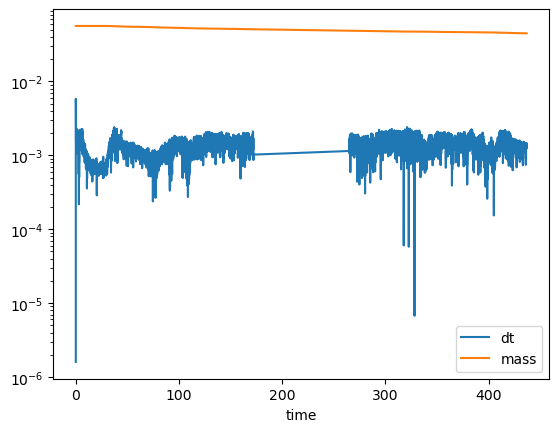

In [14]:
ax = hst.plot('time',y=['dt','mass']) # dt_mhd and gas mass in code units
ax.set_yscale('log')

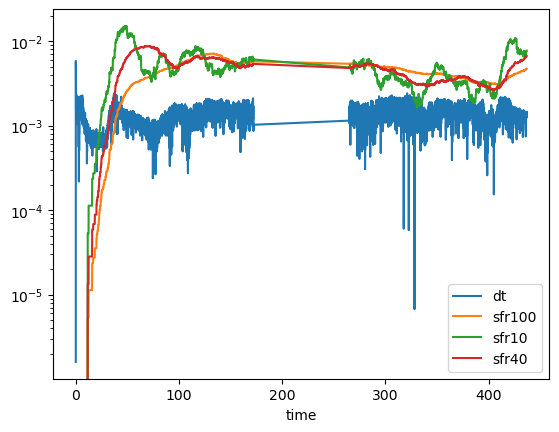

In [15]:
ax = hst.plot('time',y=['dt','sfr100','sfr10','sfr40'])
ax.set_yscale('log')

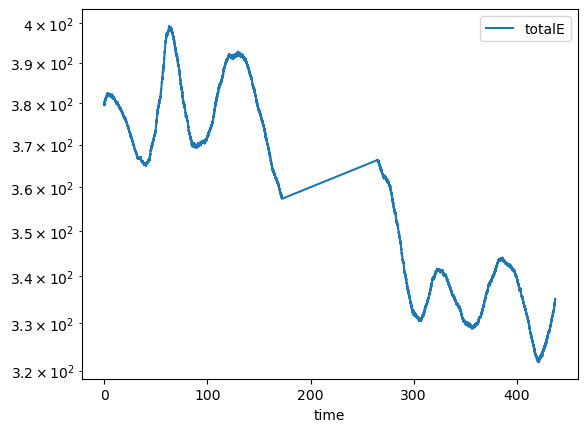

In [16]:
ax = hst.plot('time', y=['totalE'])
ax.set_yscale('log')

In [17]:
print(data.nums)

[200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390]


In [18]:
#LOADING THE VTK FILE AT A SPECIFIC TIME
num = data.nums[5]
vtk_data = data.load_vtk(num=num)

LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0250.tar. Time: 250.000600


LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0250.starpar.vtk. Time: 250.000600


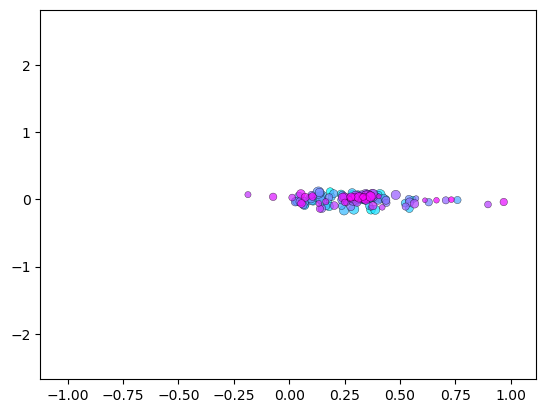

In [19]:
#LOADING THE STARPAR FILE AT A SPECIFIC TIME

def mass_norm(mass):
    return np.sqrt(mass/10)
    
sp = data.load_starpar_vtk(num=num)
sp['mage'] *= units.Myr
sp['mass'] *= units.Msun
sp['x1'] *= units.kpc
sp['x2'] *= units.kpc
sp['x3'] *= units.kpc

agemax = 40
sp = sp[sp.mage<agemax]
stars = plt.scatter(sp['x1'], sp['x3'], marker='o', s=mass_norm(sp.mass), c=sp.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.75)

In [20]:
vtk_data.dirname, vtk_data.ext

('/home/comejuliet/TIGRESS/vtk', 'tar')

In [21]:
# field names extracted from the raw vtk file
# velocity, magnetic_fields are vectors
print(vtk_data.field_list)

['density', 'velocity', 'pressure', 'cell_centered_B', 'gravitational_potential', 'temperature', 'heat_rate', 'cool_rate', 'net_cool_rate', 'CR_ionization_rate', 'rad_energy_density_PH', 'rad_energy_density_LW', 'rad_energy_density_PE', 'rad_energy_density_PE_unatt', 'rad_energy_density_LW_diss', 'specific_scalar[0]', 'specific_scalar[1]', 'xHI', 'xH2', 'xe']


In [24]:
t1 = data.nums[5]
t2 = data.nums[6]
t3 = data.nums[7]

vtk_data1 = data.load_vtk(num=t1)
vtk_data2 = data.load_vtk(num=t2)
vtk_data3 = data.load_vtk(num=t3)

efrac1 = vtk_data1.get_field(['xe'])
efrac2 = vtk_data2.get_field(['xe'])
efrac3 = vtk_data3.get_field(['xe'])

LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0250.tar. Time: 250.000600
LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0260.tar. Time: 260.000500
LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0270.tar. Time: 270.000900


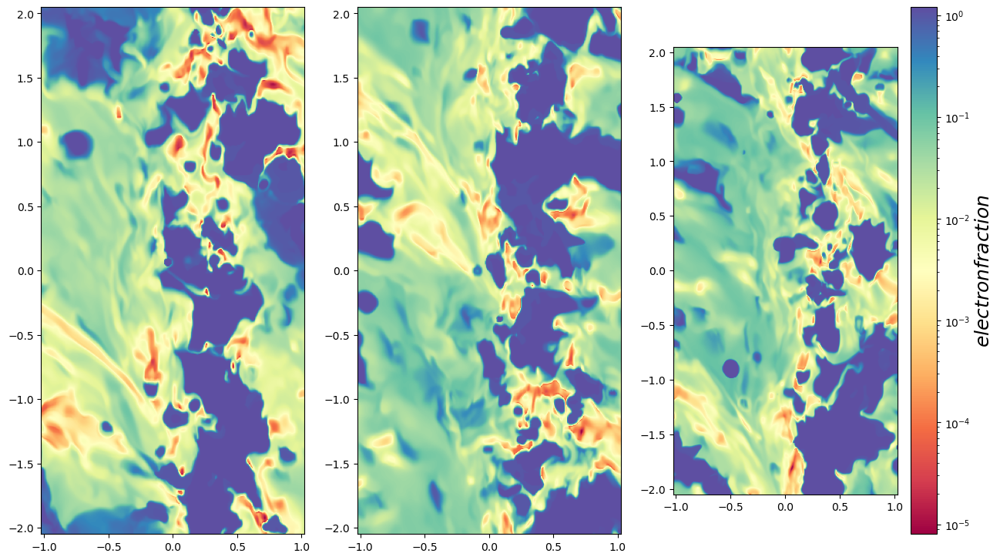

In [40]:
iz1 = vtk_data1.domain['Nx'][2] // 2
iy1 = vtk_data1.domain['Nx'][1] // 2

iz2 = vtk_data2.domain['Nx'][2] // 2
iy2 = vtk_data2.domain['Nx'][1] // 2

iz3 = vtk_data3.domain['Nx'][2] // 2
iy3 = vtk_data3.domain['Nx'][1] // 2

fig, axes = plt.subplots(1, 3, figsize=(15,10), sharex = True)
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

im1 = axes[0].imshow(efrac1['xe'][iz1,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im2 = axes[1].imshow(efrac2['xe'][iz2,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im3 = axes[2].imshow(efrac3['xe'][iz3,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])

plt.colorbar(im3,ax=axes[2],location='right', fraction=0.1).set_label(label='$electron fraction$', size=18)
plt.show()

In [23]:
print(vtk_data.derived_field_list)

['rho', 'nH', 'pok', 'r', 'vmag', 'vr', 'vx', 'vy', 'vz', 'cs', 'csound', 'Mr', 'Mr_abs', 'T', 'Td', 'cool_rate', 'heat_rate', 'net_cool_rate', 'Lambda_cool', 'nHLambda_cool', 'nHLambda_cool_net', 'Gamma_heat', 't_cool', 'vAmag', 'vAx', 'vAy', 'vAz', 'Bx', 'By', 'Bz', 'Bmag', 'nH2', '2nH2', 'xH2', '2xH2', 'nHI', 'xHI', 'nHII', 'xHII', 'nHn', 'xn', 'ne', 'nesq', 'xe', 'xCI', 'nCI', 'xOII', 'xCII', 'xCII_alt', 'xi_CR', 'T_alt', 'chi_PE', 'chi_LW', 'chi_FUV', 'Erad_LyC', 'Uion', 'j_Halpha', 'Erad_FUV', 'heat_ratio', 'NHeff', 'heat_rate_HI_phot', 'heat_rate_H2_phot', 'heat_rate_dust_LyC', 'heat_rate_dust_FUV', 'heat_rate_dust_UV', 'psi_gr', 'eps_pe', 'Gamma_pe', 'chi_H2', 'chi_CI', 'fshld_H2', 'j_X']


In [24]:
#GETTING SPECIFIC QUANTITIES WE WANT FROM THE VTK FILE
vtk = vtk_data.get_field(['density','pressure','velocity','cell_centered_B','temperature',])

In [25]:
vtk.keys()

KeysView(<xarray.Dataset>
Dimensions:           (z: 768, y: 512, x: 256)
Coordinates:
  * x                 (x) float64 -1.02e+03 -1.012e+03 ... 1.012e+03 1.02e+03
  * y                 (y) float64 -2.044e+03 -2.036e+03 ... 2.036e+03 2.044e+03
  * z                 (z) float64 -3.068e+03 -3.06e+03 ... 3.06e+03 3.068e+03
Data variables:
    density           (z, y, x) float32 3.99e-05 4.048e-05 ... 9.462e-05
    pressure          (z, y, x) float32 3.94 3.957 3.973 ... 4.087 4.063 4.044
    velocity1         (z, y, x) float32 -16.01 -13.84 -11.87 ... -9.428 -7.638
    velocity2         (z, y, x) float32 145.1 138.6 134.3 ... 95.08 94.1 92.25
    velocity3         (z, y, x) float32 -72.98 -75.06 -79.28 ... 125.1 128.9
    cell_centered_B1  (z, y, x) float32 -0.08085 -0.08521 ... -0.1052 -0.07086
    cell_centered_B2  (z, y, x) float32 0.4451 0.4443 0.4394 ... 0.3485 0.3566
    cell_centered_B3  (z, y, x) float32 -0.07467 -0.03839 ... -0.2073 -0.1642
    temperature       (z, y, x) float32

In [26]:
type(vtk['density']), vtk['density'].shape, vtk['density'][2].shape, 

(xarray.core.dataarray.DataArray, (768, 512, 256), (512, 256))

In [27]:
vtk = vtk_data.get_field(['density','T','nH','rho','vz','vy','vx','Bmag','Bx','By'])
vtk

<xarray.Dataset>
Dimensions:  (z: 768, y: 512, x: 256)
Coordinates:
  * x        (x) float64 -1.02e+03 -1.012e+03 -1.004e+03 ... 1.012e+03 1.02e+03
  * y        (y) float64 -2.044e+03 -2.036e+03 ... 2.036e+03 2.044e+03
  * z        (z) float64 -3.068e+03 -3.06e+03 -3.052e+03 ... 3.06e+03 3.068e+03
Data variables:
    density  (z, y, x) float32 3.99e-05 4.048e-05 ... 9.599e-05 9.462e-05
    vx       (z, y, x) float32 -16.01 -13.84 -11.87 ... -11.19 -9.428 -7.638
    T        (z, y, x) float32 7.286e+06 7.214e+06 ... 3.124e+06 3.155e+06
    vz       (z, y, x) float32 -72.98 -75.06 -79.28 -85.27 ... 121.5 125.1 128.9
    Bx       (z, y, x) float32 -0.04387 -0.04624 -0.04802 ... -0.05711 -0.03845
    rho      (z, y, x) float32 9.35e-29 9.486e-29 ... 2.249e-28 2.217e-28
    nH       (z, y, x) float32 3.99e-05 4.048e-05 ... 9.599e-05 9.462e-05
    By       (z, y, x) float32 0.2415 0.2411 0.2385 ... 0.1837 0.1891 0.1935
    Bmag     (z, y, x) float32 0.2488 0.2464 0.2432 ... 0.2411 0.2273 0.2165
    vy       (z, y, x) float32 145.1 138.6 134.3 132.8 ... 95.08 94.1 92.25
Attributes:
    all_grid_equal:  True
    ngrid:           768
    le:              [-1024. -2048. -3072.]
    re:              [1024. 2048. 3072.]
    dx:              [8. 8. 8.]
    Lx:              [2048. 4096. 6144.]
    center:          [0. 0. 0.]
    Nx:              [256 512 768]
    ndim:            3
    time:            250.0006
    dfi:             {'rho': {'field_dep': ['density'], 'func': <function set...

In [28]:
print(vtk['x'], vtk['y'], vtk['z']), vtk_data.domain['Nx']


<xarray.DataArray 'x' (x: 256)>
array([-1020., -1012., -1004., ...,  1004.,  1012.,  1020.])
Coordinates:
  * x        (x) float64 -1.02e+03 -1.012e+03 -1.004e+03 ... 1.012e+03 1.02e+03 <xarray.DataArray 'y' (y: 512)>
array([-2044., -2036., -2028., ...,  2028.,  2036.,  2044.])
Coordinates:
  * y        (y) float64 -2.044e+03 -2.036e+03 ... 2.036e+03 2.044e+03 <xarray.DataArray 'z' (z: 768)>
array([-3068., -3060., -3052., ...,  3052.,  3060.,  3068.])
Coordinates:
  * z        (z) float64 -3.068e+03 -3.06e+03 -3.052e+03 ... 3.06e+03 3.068e+03


(None, array([256, 512, 768]))

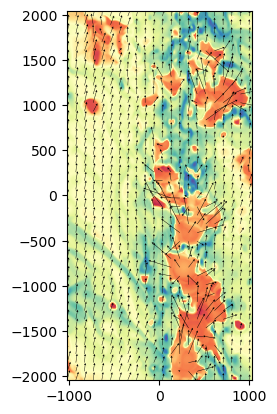

In [29]:
#plotting the velocity field over the density (nH)

iz = vtk_data.domain['Nx'][2] // 2

vx=vtk['vx'][iz,:,:]
vy=vtk['vy'][iz,:,:]

dn=12
vU=vx[::dn, ::dn]
vV=vy[::dn, ::dn]

q=ax.quiver(vtk['x'][::dn],vtk['y'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(q,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E', coordinates='data',color='r',\
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')

cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)
im = plt.imshow(vtk['nH'][iz,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1024,1024,-2048,2048])
q= plt.quiver(vtk['x'][::dn],vtk['y'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)

plt.show()


In [30]:
#try to obtain the surface density: SO SIMPLE??

print(vtk['nH'][2].shape)
print(vtk['density'][1].shape)
print(vtk['nH'].shape)
print(vtk['z'].shape)
sigma = np.trapz(vtk['density'],axis=0)
print(sigma.shape)

(512, 256)
(512, 256)
(768, 512, 256)
(768,)
(512, 256)


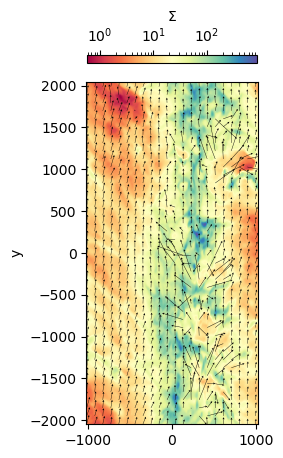

In [31]:
#plotting the velocity field over the integrated density

iz = vtk_data.domain['Nx'][2] // 2

vx=vtk['vx'][iz,:,:]
vy=vtk['vy'][iz,:,:]

dn=12
vU=vx[::dn, ::dn]
vV=vy[::dn, ::dn]

q=ax.quiver(vtk['x'][::dn],vtk['y'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(q,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E', coordinates='data',color='r',\
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')

cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)
im = plt.imshow(sigma[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1024,1024,-2048,2048])
q= plt.quiver(vtk['x'][::dn],vtk['y'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)

plt.colorbar(im,label='$\Sigma$',location='top',fraction=0.023)

im.axes.set_ylabel('x')
im.axes.set_ylabel('y')

plt.show()


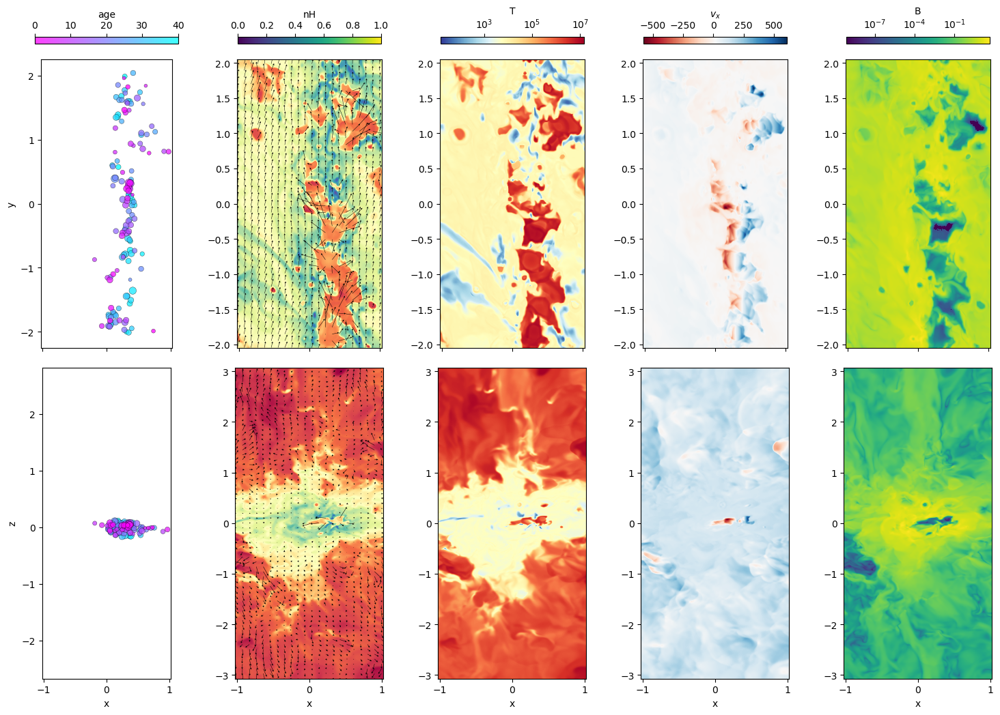

In [32]:
#plotting quantities on 2D color maps
#FIG3

iz = vtk_data.domain['Nx'][2] // 2
iy = vtk_data.domain['Nx'][1] // 2

vx1=vtk['vx'][iz,:,:]
vy=vtk['vy'][iz,:,:]

vx2=vtk['vx'][:,iy,:]
vz=vtk['vz'][:,iy,:]

dn=12
vU1=vx1[::dn, ::dn]
vU2=vx2[::dn, ::dn]
vVy=vy[::dn, ::dn]
vVz=vz[::dn, ::dn]


fig, axes = plt.subplots(2, 5, figsize=(15,10), sharex = True)
fig.tight_layout()
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

q1=ax.quiver(vtk['x'][::dn],vtk['y'][::dn],vU1,vVy,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(q1,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E',coordinates='data',color='r',
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')

q2=ax.quiver(vtk['x'][::dn],vtk['z'][::dn],vU2,vVz,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(q2,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E',coordinates='data',color='r',
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')


im1 = axes[0,0].scatter(sp['x1'], sp['x2'], marker='o', s=mass_norm(sp.mass), c=sp.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.75)
im2 = axes[0,1].imshow(vtk['nH'][iz,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im2 = axes[0,1].quiver(vtk['x'][::dn]/1000.,vtk['y'][::dn]/1000.,vU1,vVy,scale=3000,linewidths=1.5,headwidth=5)
im3 = axes[0,2].imshow(vtk['T'][iz,:,:], norm=LogNorm(), origin='lower', 
               cmap=cmap_temp,extent=[-1.024,1.024,-2.048,2.048])
im4 = axes[0,3].imshow(vtk['vx'][iz,:,:],origin='lower',cmap='RdBu',extent=[-1.024,1.024,-2.048,2.048])
im5 = axes[0,4].imshow(vtk['Bmag'][iz,:,:], norm=LogNorm(), origin='lower',cmap='viridis',extent=[-1.024,1.024,-2.048,2.048])
im6 = axes[1,0].scatter(sp['x1'], sp['x3'], marker='o', s=mass_norm(sp.mass), c=sp.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.75)
im7 = axes[1,1].imshow(vtk['nH'][:,iy,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-3.072,3.072])
im7 = axes[1,1].quiver(vtk['x'][::dn]/1000.,vtk['z'][::dn]/1000.,vU2,vVz,scale=3000,linewidths=1.5,headwidth=5)
im8 = axes[1,2].imshow(vtk['T'][:,iy,:], norm=LogNorm(), origin='lower', 
               cmap=cmap_temp,extent=[-1.024,1.024,-3.072,3.072])
im9 = axes[1,3].imshow(vtk['vx'][:,iy,:],origin='lower',cmap='RdBu',extent=[-1.024,1.024,-3.072,3.072])
im10 = axes[1,4].imshow(vtk['Bmag'][:,iy,:], norm=LogNorm(), origin='lower',cmap='viridis',extent=[-1.024,1.024,-3.072,3.072])

plt.colorbar(im1,ax=axes[0,0],label='age',location='top',fraction=0.023)
plt.colorbar(im2,ax=axes[0,1],label='nH',location='top',fraction=0.023)
plt.colorbar(im3,ax=axes[0,2],label='T',location='top',fraction=0.023)
plt.colorbar(im4,ax=axes[0,3],label='$v_{x}$',location='top',fraction=0.023)
plt.colorbar(im5,ax=axes[0,4],label='B',location='top',fraction=0.023)
#plt.colorbar(im5,ax=axes[1,0],label='nH',location='top')
#plt.colorbar(im6,ax=axes[1,1],label='T',location='top')
#plt.colorbar(im7,ax=axes[1,2],label='$v_{x}$',location='top')
#plt.colorbar(im8,ax=axes[1,3],label='B',location='top')

for im in (im2, im3, im4, im5):
    im.axes.set_aspect('equal')
    
for im in (im7, im8, im9, im10):
    im.axes.set_aspect(0.7)
    im.axes.set_xlabel('x')

im6.axes.set_xlabel('x')    
im1.axes.set_ylabel('y')
im1.axes.set_aspect(1.)
im6.axes.set_ylabel('z')
im6.axes.set_aspect(0.9)

plt.show()

In [32]:
#loading VTK files at different times 

t1 = data.nums[5]
t2 = data.nums[6]
t3 = data.nums[7]

vtk_data1 = data.load_vtk(num=t1)
vtk_data2 = data.load_vtk(num=t2)
vtk_data3 = data.load_vtk(num=t3)

vtk1 = vtk_data1.get_field(['density','T','nH','rho','vz','vy','vx','Bmag','Bx','By',])
vtk2 = vtk_data2.get_field(['density','T','nH','rho','vz','vy','vx','Bmag','Bx','By',])
vtk3 = vtk_data3.get_field(['density','T','nH','rho','vz','vy','vx','Bmag','Bx','By',])

LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0250.tar. Time: 250.000600
LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0260.tar. Time: 260.000500
LoadSim-INFO: [load_vtk_tar]: R8_8pc_NCRSP.0270.tar. Time: 270.000900


In [33]:
sigma1 = np.trapz(vtk1['density'],axis=0)
sigma2 = np.trapz(vtk1['density'],axis=0)
sigma3 = np.trapz(vtk1['density'],axis=0)

LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0250.starpar.vtk. Time: 250.000600
LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0260.starpar.vtk. Time: 260.000500
LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0270.starpar.vtk. Time: 270.000900


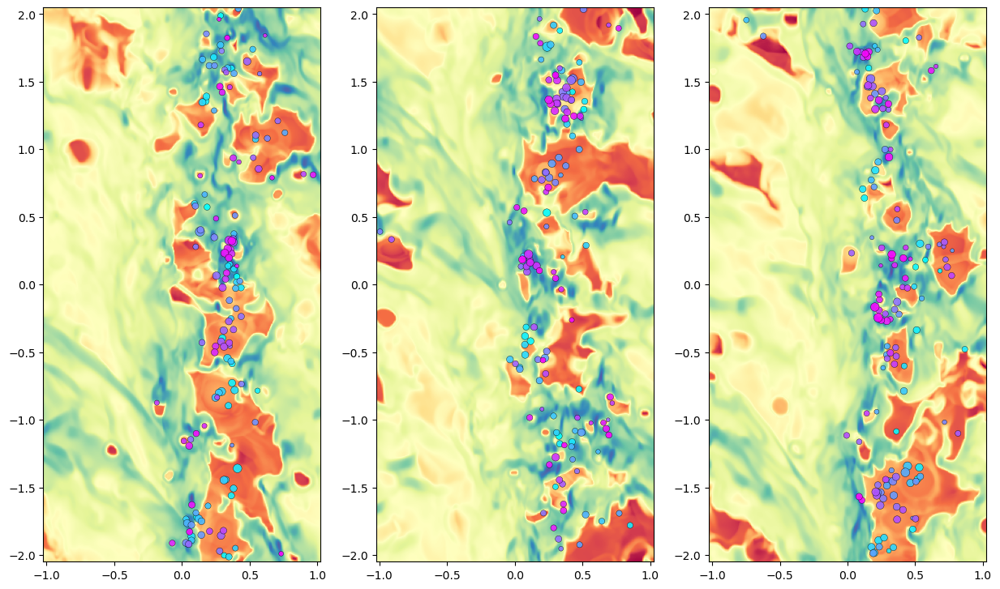

In [34]:
#plotting star particles over density
#BUT YOU SHOULD PLOT THEM OVER THE SURFACE DENSITY
#FIG1

iz1 = vtk_data1.domain['Nx'][2] // 2
iy1 = vtk_data1.domain['Nx'][1] // 2

iz2 = vtk_data2.domain['Nx'][2] // 2
iy2 = vtk_data2.domain['Nx'][1] // 2

iz3 = vtk_data3.domain['Nx'][2] // 2
iy3 = vtk_data3.domain['Nx'][1] // 2

def mass_norm(mass):
    return np.sqrt(mass/10)
    
agemax = 40

sp1 = data.load_starpar_vtk(num=t1)
sp1['mage'] *= data.u.Myr
sp1['mass'] *= data.u.Msun
sp1['x1'] *= units.kpc
sp1['x2'] *= units.kpc
sp1['x3'] *= units.kpc
sp1 = sp1[sp1.mage<agemax]

sp2 = data.load_starpar_vtk(num=t2)
sp2['mage'] *= data.u.Myr
sp2['mass'] *= data.u.Msun
sp2['x1'] *= units.kpc
sp2['x2'] *= units.kpc
sp2['x3'] *= units.kpc
sp2 = sp2[sp2.mage<agemax]

sp3 = data.load_starpar_vtk(num=t3)
sp3['mage'] *= data.u.Myr
sp3['mass'] *= data.u.Msun
sp3['x1'] *= units.kpc
sp3['x2'] *= units.kpc
sp3['x3'] *= units.kpc
sp3 = sp3[sp3.mage<agemax]

fig, axes = plt.subplots(1, 3, figsize=(15,10), sharex = True)
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

im1 = axes[0].imshow(vtk1['nH'][iz1,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im2 = axes[1].imshow(vtk2['nH'][iz2,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im3 = axes[2].imshow(vtk3['nH'][iz3,:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])

im1 = axes[0].scatter(sp1['x1'], sp1['x2'], marker='o', s=mass_norm(sp1.mass), c=sp1.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)
im2 = axes[1].scatter(sp2['x1'], sp2['x2'], marker='o', s=mass_norm(sp2.mass), c=sp2.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)
im3 = axes[2].scatter(sp3['x1'], sp3['x2'], marker='o', s=mass_norm(sp3.mass), c=sp3.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)

plt.show()

LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0250.starpar.vtk. Time: 250.000600
LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0260.starpar.vtk. Time: 260.000500
LoadSim-INFO: [load_starpar_vtk]: R8_8pc_NCRSP.0270.starpar.vtk. Time: 270.000900


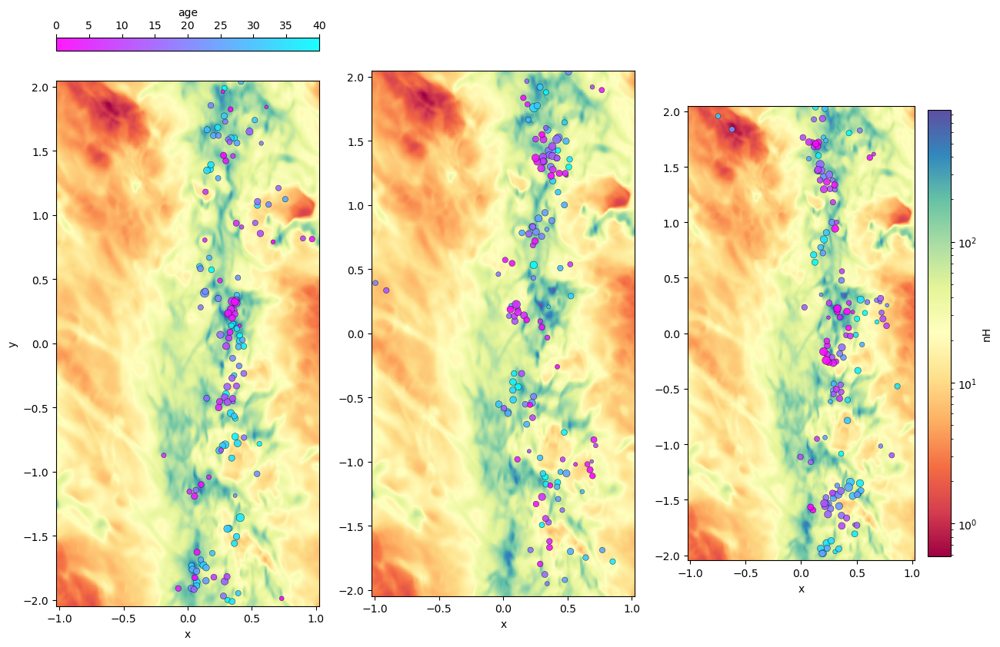

In [69]:
#plotting star particles over surface density
#FIG1

def mass_norm(mass):
    return np.sqrt(mass/10)
    
agemax = 40

sp1 = data.load_starpar_vtk(num=t1)
sp1['mage'] *= data.u.Myr
sp1['mass'] *= data.u.Msun
sp1['x1'] *= units.kpc
sp1['x2'] *= units.kpc
sp1['x3'] *= units.kpc
sp1 = sp1[sp1.mage<agemax]

sp2 = data.load_starpar_vtk(num=t2)
sp2['mage'] *= data.u.Myr
sp2['mass'] *= data.u.Msun
sp2['x1'] *= units.kpc
sp2['x2'] *= units.kpc
sp2['x3'] *= units.kpc
sp2 = sp2[sp2.mage<agemax]

sp3 = data.load_starpar_vtk(num=t3)
sp3['mage'] *= data.u.Myr
sp3['mass'] *= data.u.Msun
sp3['x1'] *= units.kpc
sp3['x2'] *= units.kpc
sp3['x3'] *= units.kpc
sp3 = sp3[sp3.mage<agemax]

fig, axes = plt.subplots(1, 3, figsize=(15,10), sharex = True)
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

im1 = axes[0].imshow(sigma1[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im2 = axes[1].imshow(sigma2[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])
im3 = axes[2].imshow(sigma3[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1.024,1.024,-2.048,2.048])

plt.colorbar(im3,ax=axes[2],label='nH',location='right',fraction=0.085)

im1 = axes[0].scatter(sp1['x1'], sp1['x2'], marker='o', s=mass_norm(sp1.mass), c=sp1.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)
im2 = axes[1].scatter(sp2['x1'], sp2['x2'], marker='o', s=mass_norm(sp2.mass), c=sp2.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)
im3 = axes[2].scatter(sp3['x1'], sp3['x2'], marker='o', s=mass_norm(sp3.mass), c=sp3.mage,
                edgecolor='black', linewidth=0.3, vmax=agemax, vmin=0, cmap='cool_r', zorder=2, alpha=0.9)

for im in (im1, im2, im3):
    im.axes.set_xlabel('x')

plt.colorbar(im1,ax=axes[0],label='age',location='top',fraction=0.023)
    
im1.axes.set_ylabel('y')


plt.show()

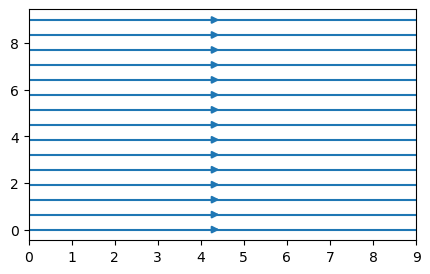

In [36]:
#EXAMPLE FOR STREAMLINE
# Creating dataset
x = np.arange(0, 10)
y = np.arange(0, 10)
 
# Creating grids
X, Y = np.meshgrid(x, y)
 
# x-component to the right
u = np.ones((10, 10))
 
# y-component zero
v = np.zeros((10, 10))
 
fig = plt.figure(figsize = (5, 3))
 
# Plotting stream plot
plt.streamplot(X, Y, u, v, density = 0.5)
 
# show plot
plt.show()

In [37]:
print(x.size,y.size,u.size,v.size)

10 10 100 100


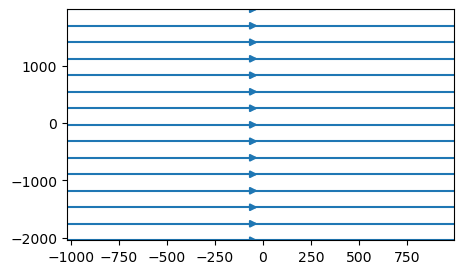

In [38]:
#CREATING THE ACTUAL XY GRID I NEED TO PLOT THE DATA OVER (check the y direction, on the article 0kpc-6kpc)

dn=12
x = vtk['x'][::dn]
y = vtk['y'][::dn]
Bx = vtk['Bx'][::dn,::dn,::dn]
By = vtk['By'][::dn,::dn,::dn]

X, Y = np.meshgrid(x, y)

# x-component to the right
u = np.ones((43,22))
 
# y-component zero
v = np.zeros((43,22))
 
fig = plt.figure(figsize = (5, 3))
 
# Plotting stream plot
plt.streamplot(X, Y, u, v, density = 0.5)

In [39]:
print(x.shape,y.shape,X.shape,Y.shape,u.shape,v.shape,Bx.shape,By.shape)

(22,) (43,) (43, 22) (43, 22) (43, 22) (43, 22) (64, 43, 22) (64, 43, 22)


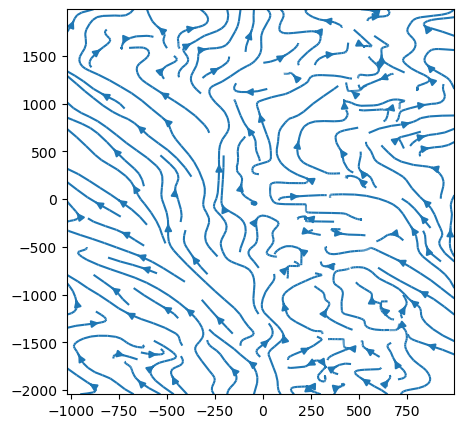

In [40]:
#ATTEMPTING TO MAKE THE STREAMLINE PLOTS OF THE VERTICALLY INTEGRATED MAGNETIC FIELDS ON THE GAS SURFACE DENSITY (AT DIFFERENT TIMES)
#first try: plotting the magnetic field components at z=0 instead of the integrated mag field
#FIG2
iz = vtk_data.domain['Nx'][2] // 2

dn=12
x = vtk['x'][::dn]
y = vtk['y'][::dn]
Bx = vtk['Bx'][iz,::dn,::dn]
By = vtk['By'][iz,::dn,::dn]

X, Y = np.meshgrid(x, y)

# x-component to the right
u = Bx
 
# y-component zero
v = By
 
fig = plt.figure(figsize = (5, 5))
 
# Plotting stream plot
plt.streamplot(X, Y, u, v, density = 1.)

In [41]:
print(vtk1['Bx'].shape)
Bx1_int = np.trapz(vtk1['Bx']*vtk1['density'],axis=0)
By1_int = np.trapz(vtk1['By']*vtk1['density'],axis=0)

Bx1 = Bx1_int/sigma1
By1 = By1_int/sigma1

Bx2_int = np.trapz(vtk2['Bx']*vtk2['density'],axis=0)
By2_int = np.trapz(vtk2['By']*vtk2['density'],axis=0)

Bx2 = Bx2_int/sigma2
By2 = By1_int/sigma2


Bx3_int = np.trapz(vtk3['Bx']*vtk3['density'],axis=0)
By3_int = np.trapz(vtk3['By']*vtk3['density'],axis=0)

Bx3 = Bx3_int/sigma3
By3 = By3_int/sigma3


print(x.shape,y.shape,X.shape,Y.shape,u.shape,v.shape,Bx.shape,By.shape)

(768, 512, 256)
(22,) (43,) (43, 22) (43, 22) (43, 22) (43, 22) (43, 22) (43, 22)


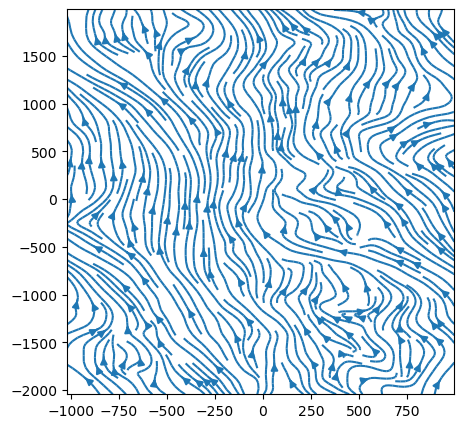

In [42]:
dn=12
x = vtk['x'][::dn]
y = vtk['y'][::dn]

X, Y = np.meshgrid(x, y)

# x-component to the right
u = Bx1[::dn,::dn]
 
# y-component zero
v = By1[::dn,::dn]
 
fig = plt.figure(figsize = (5, 5))
 
# Plotting stream plot
plt.streamplot(X, Y, u, v, density = 2.)

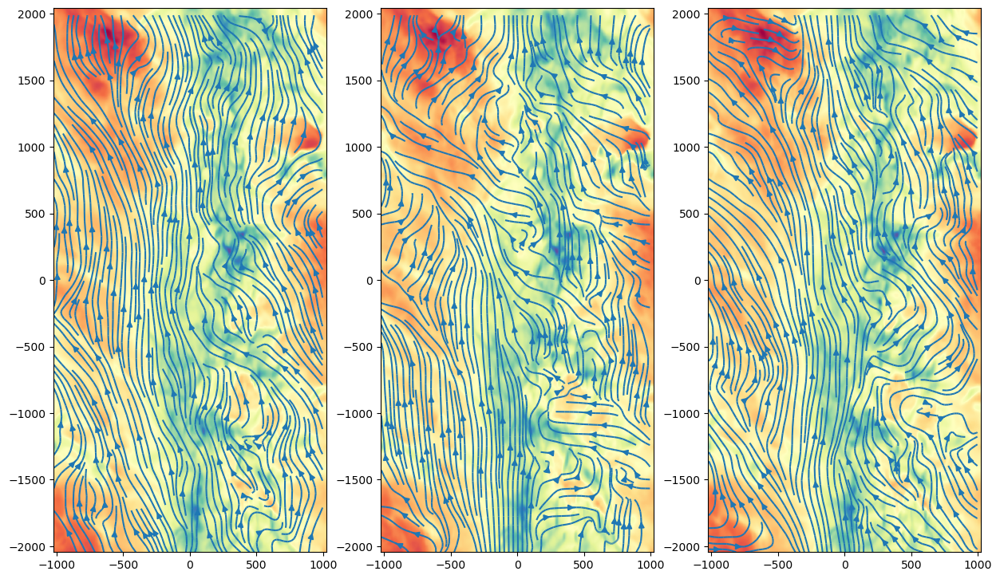

In [43]:
dn=12
x = vtk1['x'][::dn]
y = vtk1['y'][::dn]
X, Y = np.meshgrid(x, y)

u1 = Bx1[::dn,::dn]
v1 = By1[::dn,::dn]

u2 = Bx2[::dn,::dn]
v2 = By2[::dn,::dn]

u3 = Bx3[::dn,::dn]
v3 = By3[::dn,::dn]
 
fig, axes = plt.subplots(1, 3, figsize=(15,10), sharex = True)
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

im1 = axes[0].streamplot(X, Y, u1, v1, density = 2.)
im2 = axes[1].streamplot(X, Y, u2, v2, density = 2.)
im3 = axes[2].streamplot(X, Y, u3, v3, density = 2.)

im1 = axes[0].imshow(sigma1[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1024,1024,-2044,2044])
im2 = axes[1].imshow(sigma2[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1024,1024,-2044,2044])
im3 = axes[2].imshow(sigma3[:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-1024,1024,-2044,2044])


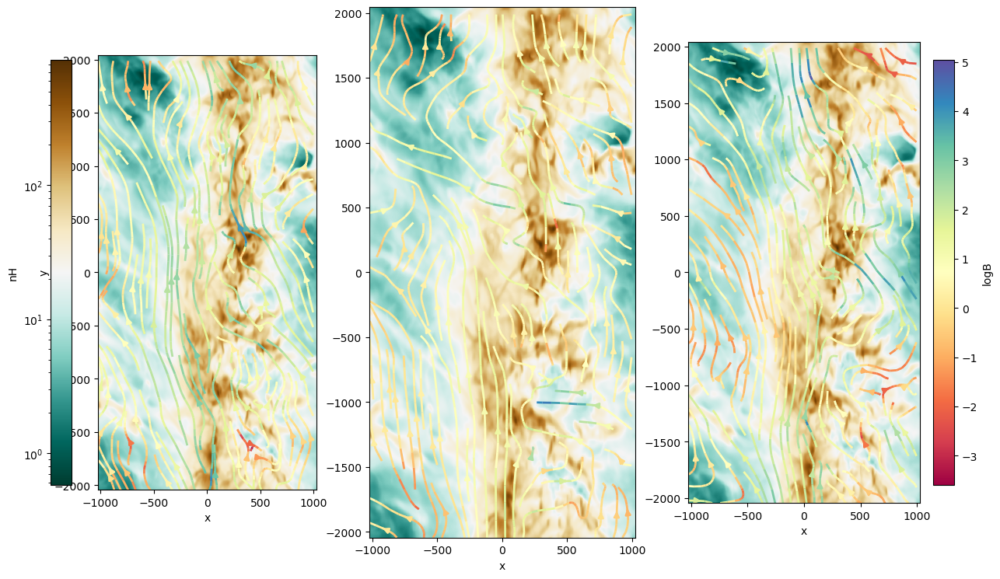

In [84]:
#varying color along the streamlines according to the magnetic field strength
dn=12
x = vtk1['x'][::dn]
y = vtk1['y'][::dn]
X, Y = np.meshgrid(x, y)

u1 = Bx1[::dn,::dn]
v1 = By1[::dn,::dn]

u2 = Bx2[::dn,::dn]
v2 = By2[::dn,::dn]

u3 = Bx3[::dn,::dn]
v3 = By3[::dn,::dn]

color1 = np.log(np.sqrt(u1**2.+v1**2.))
color2 = np.log(np.sqrt(u2**2.+v2**2.))
color3 = np.log(np.sqrt(u3**2.+v3**2.))
 
fig, axes = plt.subplots(1, 3, figsize=(15,10), sharex = True)
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)

im1 = axes[0].streamplot(X, Y, u1, v1, color = color1, linewidth = 2, cmap ='Spectral')
im2 = axes[1].streamplot(X, Y, u2, v2, color = color2, linewidth = 2, cmap ='Spectral')
im3 = axes[2].streamplot(X, Y, u3, v3, color = color3, linewidth = 2, cmap ='Spectral')

plt.colorbar(im3.lines,label='logB',location='right',fraction=0.08)

im1 = axes[0].imshow(sigma1[:,:], norm=LogNorm(), origin='lower',cmap='BrBG_r',extent=[-1024,1024,-2044,2044])
im2 = axes[1].imshow(sigma2[:,:], norm=LogNorm(), origin='lower',cmap='BrBG_r',extent=[-1024,1024,-2044,2044])
im3 = axes[2].imshow(sigma3[:,:], norm=LogNorm(), origin='lower',cmap='BrBG_r',extent=[-1024,1024,-2044,2044])

for im in (im1, im2, im3):
    im.axes.set_xlabel('x')

plt.colorbar(im1,ax=axes[0],label='nH',location='left',fraction=0.08)
    
im1.axes.set_ylabel('y')

plt.show()

Text(0, 0.5, 'z')

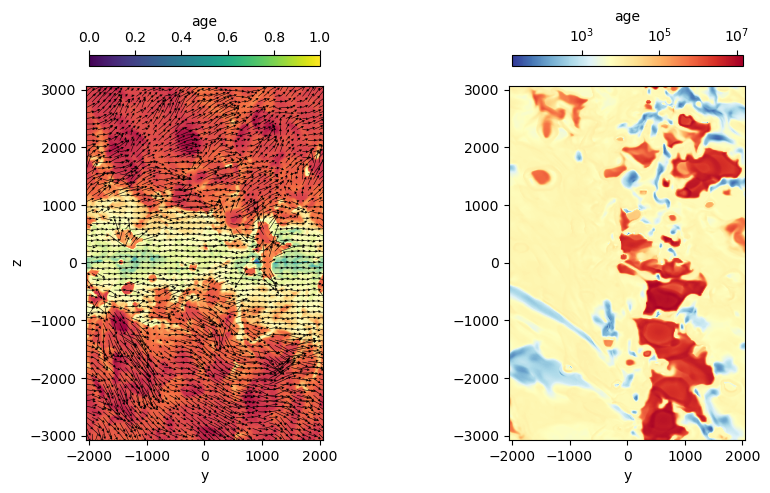

In [44]:
#FIG7 distribution of gas density and gas temperature at a specific x --> molto diversa, capire perchè

ix = 240
#vtk_data.domain['Nx'][0] // 2

vy=vtk['vy'][:,:,ix]
vz=vtk['vz'][:,:,ix]

dn=12
vU=vy[::dn, ::dn]
vV=vz[::dn, ::dn]

q=ax.quiver(vtk['y'][::dn],vtk['z'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(q,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E', coordinates='data',color='r',\
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')


fig, axes = plt.subplots(1, 2, figsize=(10,5))
cmap_temp = pa.cmap_shift(mpl.cm.RdYlBu_r, midpoint=3.0/7.0)
im1 = axes[0].imshow(vtk['nH'][:,:,ix], norm=LogNorm(), origin='lower',cmap='Spectral', extent=[-2048,2048,-3072,3072])
im1 = axes[0].quiver(vtk['y'][::dn],vtk['z'][::dn],vU,vV,scale=3000,linewidths=1.5,headwidth=5)
im2 = axes[1].imshow(vtk['T'][iz,:,:], norm=LogNorm(), origin='lower', 
               cmap=cmap_temp, extent=[-2048,2048,-3072,3072])

plt.colorbar(im1,ax=axes[0],label='age',location='top',fraction=0.03)
plt.colorbar(im2,ax=axes[1],label='age',location='top',fraction=0.03)

im1.axes.set_xlabel('y')
im2.axes.set_xlabel('y')
im1.axes.set_ylabel('z')


In [33]:
help(vtk_data.get_slice)

Help on method get_slice in module pyathena.io.read_vtk:

get_slice(axis, field='density', pos='c', method='nearest') method of pyathena.io.read_vtk_tar.AthenaDataSetTar instance
    Read slice of fields.
    
    Parameters
    ----------
    axis : str
        Axis to slice along. 'x' or 'y' or 'z'
    field : (list of) str
        The name of the field(s) to be read.
    pos : float or str
        Slice through If 'c' or 'center', get a slice through the domain
        center. Default value is 'c'.
    method : str
    
    
    Returns
    -------
    slc : xarray dataset
        An xarray dataset containing slices.



In [34]:
slc_x = vtk_data.get_slice('x', ['nH', 'T','vy','vz','Bmag','By','Bz'])

In [35]:
slc_x

<xarray.Dataset>
Dimensions:  (y: 512, z: 768)
Coordinates:
    x        float64 4.0
  * y        (y) float64 -2.044e+03 -2.036e+03 ... 2.036e+03 2.044e+03
  * z        (z) float64 -3.068e+03 -3.06e+03 -3.052e+03 ... 3.06e+03 3.068e+03
Data variables:
    T        (z, y) float32 3.161e+05 2.494e+05 ... 1.135e+06 1.129e+06
    vz       (z, y) float32 0.1234 -0.4427 -0.9354 -0.926 ... 83.62 84.15 84.58
    Bz       (z, y) float32 0.1816 0.1697 0.1561 0.1408 ... 0.1047 0.112 0.1158
    nH       (z, y) float32 0.000479 0.0005812 0.0005769 ... 0.0002103 0.0002106
    By       (z, y) float32 0.02857 -0.004189 -0.0284 ... -0.02899 -0.02819
    Bmag     (z, y) float32 0.3298 0.3095 0.2821 0.2503 ... 0.1147 0.1216 0.1256
    vy       (z, y) float32 129.5 126.9 125.3 123.6 ... 138.7 140.8 142.9 145.0
Attributes:
    all_grid_equal:  True
    ngrid:           768
    le:              [-1024. -2048. -3072.]
    re:              [1024. 2048. 3072.]
    dx:              [8. 8. 8.]
    Lx:              [2048. 4096. 6144.]
    center:          [0. 0. 0.]
    Nx:              [256 512 768]
    ndim:            3
    time:            250.0006
    dfi:             {'rho': {'field_dep': ['density'], 'func': <function set...

In [36]:
slc_x['y'], slc_x['z']

(<xarray.DataArray 'y' (y: 512)>
 array([-2044., -2036., -2028., ...,  2028.,  2036.,  2044.])
 Coordinates:
     x        float64 4.0
   * y        (y) float64 -2.044e+03 -2.036e+03 ... 2.036e+03 2.044e+03,
 <xarray.DataArray 'z' (z: 768)>
 array([-3068., -3060., -3052., ...,  3052.,  3060.,  3068.])
 Coordinates:
     x        float64 4.0
   * z        (z) float64 -3.068e+03 -3.06e+03 -3.052e+03 ... 3.06e+03 3.068e+03)

In [37]:
slc_x['vy'][0].shape

(512,)

In [38]:
type(slc_x), type(slc_x.nH), type(slc_x.nH.data)

(xarray.core.dataset.Dataset, xarray.core.dataarray.DataArray, numpy.ndarray)

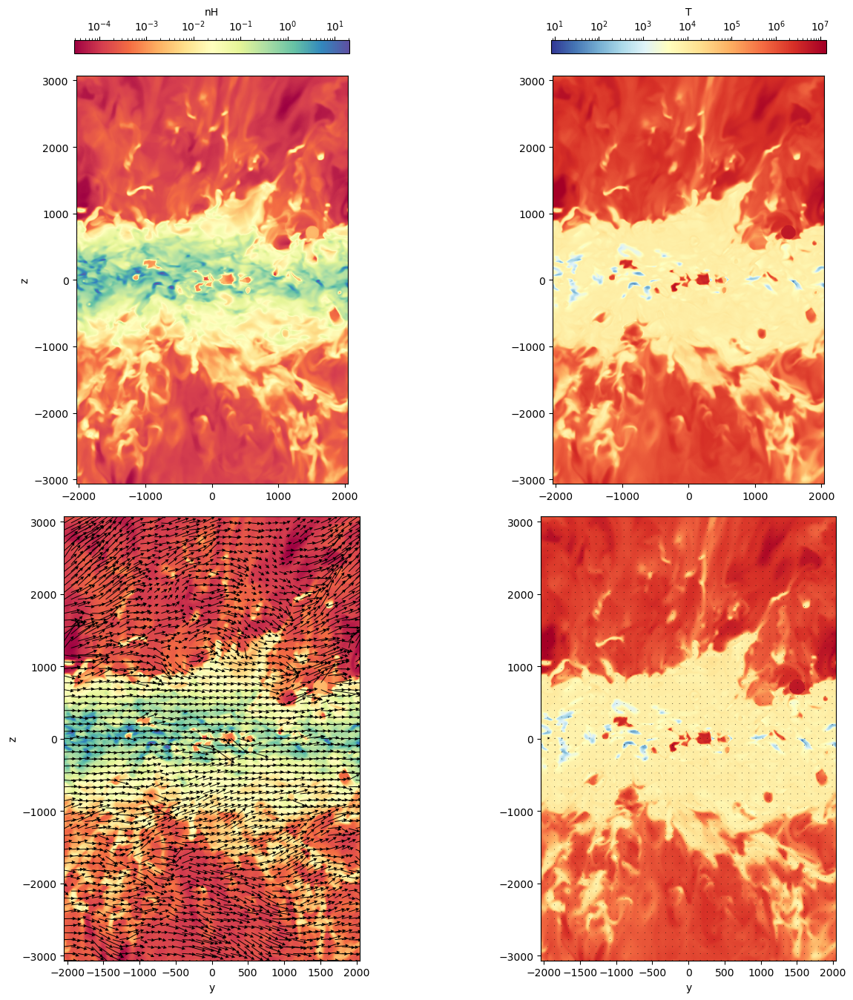

In [41]:
#Plotting slices (Fig.6 article) -  NEED TO FIX THE DIMENSIONS

By=slc_x['By'][:,:]
Bz=slc_x['Bz'][:,:]
vy=slc_x['vy'][:,:]
vz=slc_x['vz'][:,:]
y=slc_x['y'][:] 
z=slc_x['z'][:] 


dn=12
Uv=vy[::dn, ::dn]
Vv=vz[::dn, ::dn]
UB=By[::dn, ::dn]
VB=Bz[::dn, ::dn]

qv=ax.quiver(y[::dn],z[::dn],Uv,Vv,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(qv,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E',coordinates='data',color='r',
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')

qB=ax.quiver(y[::dn],z[::dn],UB,VB,scale=3000,linewidths=1.5,headwidth=5)
ax.quiverkey(qB,-1.,0.3,300,label='300 km s$^{-1}$',labelpos='E',coordinates='data',color='r',
             fontproperties={'size': 18, 'weight':'bold'},labelcolor='r')

fig, axes = plt.subplots(2, 2, figsize=(13, 13))
fig.tight_layout()

im1 = axes[0,0].imshow(slc_x['nH'][:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-2044,2044,-3068,3068])
im2 = axes[0,1].imshow(slc_x['T'][:,:], norm=LogNorm(), origin='lower',cmap=cmap_temp,extent=[-2044,2044,-3068,3068])
im3 = axes[1,0].imshow(slc_x['nH'][:,:], norm=LogNorm(), origin='lower',cmap='Spectral',extent=[-2044,2044,-3068,3068])
im3 = axes[1,0].quiver(y[::dn],z[::dn],Uv,Vv,scale=3000,linewidths=1.5,headwidth=5)
im4 = axes[1,1].imshow(slc_x['T'][:,:], norm=LogNorm(), origin='lower',cmap=cmap_temp,extent=[-2044,2044,-3068,3068])
im4 = axes[1,1].quiver(y[::dn],z[::dn],UB,VB,scale=3000,linewidths=1.5,headwidth=5)

plt.colorbar(im1,ax=axes[0,0],label='nH',location='top',fraction=0.031)
plt.colorbar(im2,ax=axes[0,1],label='T',location='top',fraction=0.031)

for im in (im1, im2):
    im.axes.set_aspect('equal')  
    
for im in (im3, im4):
    im.axes.set_aspect('equal')
    im.axes.set_xlabel('y')

for im in (im1, im3):
    im.axes.set_ylabel('z')
    
plt.show()

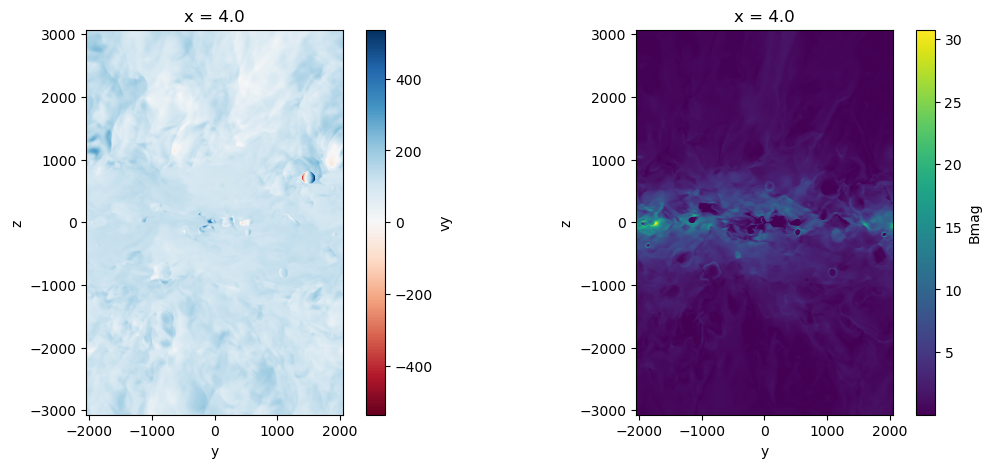

In [52]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
im1 = slc_x['vy'].plot(ax=axes[0],cmap='RdBu')
im2 = slc_x['Bmag'].plot(ax=axes[1],cmap='viridis')
for im in (im1, im2):
    im.axes.set_aspect('equal')

Text(0, 0.5, '$\\log_{10}\\,T$')

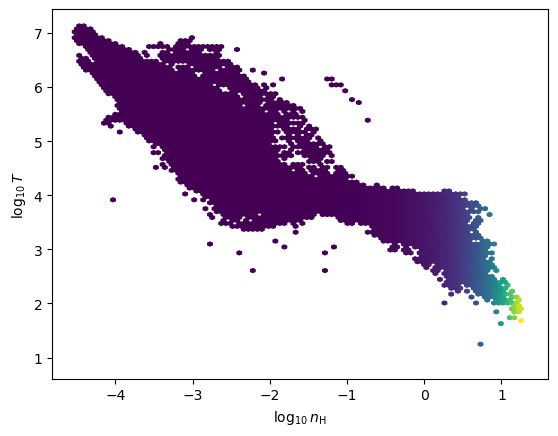

In [53]:
nH = slc_x['nH'].data.flatten()
lognH = np.log10(nH)
logT = np.log10(slc_x['T'].data.flatten())
plt.hexbin(lognH, logT, nH, mincnt=1)
plt.xlabel(r'$\log_{10}\,n_{\rm H}$')
plt.ylabel(r'$\log_{10}\,T$')